In [1]:
%pip install numpy==1.24.4 --force-reinstall --no-cache-dir

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 241.3 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
jaxlib 0.5.1 requires numpy>=1.25, but you have numpy 1.24.4 which is incompatible.
thinc 8.3.6 requires numpy<3.0.0,>=2.0.0, but you have numpy 1.24.4 which is incompatible.
pymc 5.23.0 requires numpy>=1.25.0, but you have numpy 1.24.4 which is incompatible.
tensorflow 2.18.0 requires numpy<2.1.0,>=1.26.0, but you have numpy 1.24.4 which is incompatible.
blosc2 3.4.0 requires numpy>=1.26, but you have numpy 1.24.4 which is incompatible.
xarray-einstats 0.9.0 requires numpy>=1.25, but you have numpy 1.24.4 which is incompatible.
treescope 0.1.9 requires numpy>=1.25.2, but you have numpy 1.2

In [1]:
%pip install pmdarima --no-cache-dir

In [2]:
from pmdarima import auto_arima

In [3]:
!pip install yfinance

In [ ]:
!pip uninstall numpy -y
!pip uninstall pmdarima -y
!pip install numpy pmdarima
from pmdarima import auto_arima

In [4]:
# read files shared via google-drive-link
# https://stackoverflow.com/questions/62759748/downloading-data-from-a-shared-google-drive-link-in-google-colab

!pip uninstall gdown -y && pip install gdown
!gdown -V

Found existing installation: gdown 5.2.0
Uninstalling gdown-5.2.0:
  Successfully uninstalled gdown-5.2.0
gdown 5.2.0 at /usr/local/lib/python3.11/dist-packages


In [5]:
# IMPORTS
import numpy as np
import pandas as pd

#Fin Data Sources
import yfinance as yf
import pandas_datareader as pdr

#Data viz
import plotly.graph_objs as go
import plotly.graph_objects as go
import plotly.express as px

import time
from datetime import date

# for graphs
import matplotlib.pyplot as plt

# 0) Dataset for Modeling: Final Preparations

## 0.1) Importing data from Drive & defining variable sets
* automated version need to have a daily updated file/database entries

In [6]:
# https://stackoverflow.com/questions/62759748/downloading-data-from-a-shared-google-drive-link-in-google-colab
# truncated data from Module 2: https://drive.google.com/file/d/1mb0ae2M5AouSDlqcUnIwaHq7avwGNrmB/view?usp=sharing
!gdown https://drive.google.com/file/d/1mb0ae2M5AouSDlqcUnIwaHq7avwGNrmB/view?usp=sharing --fuzzy -O /content/




Downloading...
From (original): https://drive.google.com/uc?id=1mb0ae2M5AouSDlqcUnIwaHq7avwGNrmB
From (redirected): https://drive.google.com/uc?id=1mb0ae2M5AouSDlqcUnIwaHq7avwGNrmB&confirm=t&uuid=0f4d270c-f05f-45f2-a483-bcbc4b6b328f
To: /content/stocks_df_combined_2025_06_13.parquet.brotli
100% 130M/130M [00:02<00:00, 54.8MB/s]


In [7]:
# truncated
# df = pd.read_parquet("/content/stocks_df_combined_trunc_2014_2023.parquet.brotli", )

# full dataset for 33 stocks
df_full = pd.read_parquet("/content/stocks_df_combined_2025_06_13.parquet.brotli", )


In [8]:
df_full.info()

<class 'pandas.core.frame.DataFrame'>
Index: 230262 entries, 0 to 5700
Columns: 203 entries, Open to growth_btc_usd_365d
dtypes: datetime64[ns](3), float64(129), int32(64), int64(5), object(2)
memory usage: 302.2+ MB


In [9]:
df_full.keys()

Index(['Open', 'High', 'Low', 'Close_x', 'Volume', 'Dividends', 'Stock Splits',
       'Ticker', 'Year', 'Month',
       ...
       'growth_brent_oil_7d', 'growth_brent_oil_30d', 'growth_brent_oil_90d',
       'growth_brent_oil_365d', 'growth_btc_usd_1d', 'growth_btc_usd_3d',
       'growth_btc_usd_7d', 'growth_btc_usd_30d', 'growth_btc_usd_90d',
       'growth_btc_usd_365d'],
      dtype='object', length=203)

In [10]:
# growth indicators (but not future growth)
GROWTH = [g for g in df_full.keys() if (g.find('growth_')==0)&(g.find('future')<0)]
GROWTH

['growth_1d',
 'growth_3d',
 'growth_7d',
 'growth_30d',
 'growth_90d',
 'growth_365d',
 'growth_dax_1d',
 'growth_dax_3d',
 'growth_dax_7d',
 'growth_dax_30d',
 'growth_dax_90d',
 'growth_dax_365d',
 'growth_snp500_1d',
 'growth_snp500_3d',
 'growth_snp500_7d',
 'growth_snp500_30d',
 'growth_snp500_90d',
 'growth_snp500_365d',
 'growth_dji_1d',
 'growth_dji_3d',
 'growth_dji_7d',
 'growth_dji_30d',
 'growth_dji_90d',
 'growth_dji_365d',
 'growth_epi_1d',
 'growth_epi_3d',
 'growth_epi_7d',
 'growth_epi_30d',
 'growth_epi_90d',
 'growth_epi_365d',
 'growth_gold_1d',
 'growth_gold_3d',
 'growth_gold_7d',
 'growth_gold_30d',
 'growth_gold_90d',
 'growth_gold_365d',
 'growth_wti_oil_1d',
 'growth_wti_oil_3d',
 'growth_wti_oil_7d',
 'growth_wti_oil_30d',
 'growth_wti_oil_90d',
 'growth_wti_oil_365d',
 'growth_brent_oil_1d',
 'growth_brent_oil_3d',
 'growth_brent_oil_7d',
 'growth_brent_oil_30d',
 'growth_brent_oil_90d',
 'growth_brent_oil_365d',
 'growth_btc_usd_1d',
 'growth_btc_usd_3d',


In [11]:
# leaving only Volume ==> generate ln(Volume)
OHLCV = ['Open','High','Low','Close','Adj Close_x','Volume']

In [12]:
CATEGORICAL = ['Month', 'Weekday', 'Ticker', 'ticker_type']

In [13]:
TO_PREDICT = [g for g in df_full.keys() if (g.find('future')>=0)]
TO_PREDICT

['growth_future_30d', 'is_positive_growth_30d_future']

In [14]:
TO_DROP = ['Year','Date','index_x', 'index_y', 'index', 'Quarter','Adj Close_y'] + CATEGORICAL + OHLCV
TO_DROP

['Year',
 'Date',
 'index_x',
 'index_y',
 'index',
 'Quarter',
 'Adj Close_y',
 'Month',
 'Weekday',
 'Ticker',
 'ticker_type',
 'Open',
 'High',
 'Low',
 'Close',
 'Adj Close_x',
 'Volume']

In [16]:
# let's define on more custom numerical features
df_full['ln_volume'] = df_full.Volume.replace(0, np.nan).apply(np.log)

In [17]:
# manually defined features
CUSTOM_NUMERICAL = ['SMA10', 'SMA20', 'growing_moving_average', 'high_minus_low_relative','volatility', 'ln_volume']

In [18]:
# All Supported Ta-lib indicators: https://github.com/TA-Lib/ta-lib-python/blob/master/docs/funcs.md

TECHNICAL_INDICATORS = ['adx', 'adxr', 'apo', 'aroon_1','aroon_2', 'aroonosc',
 'bop', 'cci', 'cmo','dx', 'macd', 'macdsignal', 'macdhist', 'macd_ext',
 'macdsignal_ext', 'macdhist_ext', 'macd_fix', 'macdsignal_fix',
 'macdhist_fix', 'mfi', 'minus_di', 'mom', 'plus_di', 'dm', 'ppo',
 'roc', 'rocp', 'rocr', 'rocr100', 'rsi', 'slowk', 'slowd', 'fastk',
 'fastd', 'fastk_rsi', 'fastd_rsi', 'trix', 'ultosc', 'willr',
 'ad', 'adosc', 'obv', 'atr', 'natr', 'ht_dcperiod', 'ht_dcphase',
 'ht_phasor_inphase', 'ht_phasor_quadrature', 'ht_sine_sine', 'ht_sine_leadsine',
 'ht_trendmod', 'avgprice', 'medprice', 'typprice', 'wclprice']

In [19]:
TECHNICAL_PATTERNS = [g for g in df_full.keys() if g.find('cdl')>=0]
print(f'Technical patterns count = {len(TECHNICAL_PATTERNS)}, examples = {TECHNICAL_PATTERNS[0:5]}')


Technical patterns count = 61, examples = ['cdl2crows', 'cdl3blackrows', 'cdl3inside', 'cdl3linestrike', 'cdl3outside']


In [20]:
MACRO = ['gdppot_us_yoy', 'gdppot_us_qoq', 'cpi_core_yoy', 'cpi_core_mom', 'FEDFUNDS',
 'DGS1', 'DGS5', 'DGS10']

In [21]:
NUMERICAL = GROWTH + TECHNICAL_INDICATORS + TECHNICAL_PATTERNS + CUSTOM_NUMERICAL + MACRO

In [22]:
# CHECK: NO OTHER INDICATORS LEFT
OTHER = [k for k in df_full.keys() if k not in OHLCV + CATEGORICAL + NUMERICAL + TO_DROP]
OTHER

['Close_x',
 'Dividends',
 'Stock Splits',
 'growth_future_30d',
 'is_positive_growth_30d_future',
 'Close_y']

In [23]:
df_full.Ticker.nunique()

33

In [24]:
# tickers, min-max date, count of daily observations
df_full.groupby(['Ticker'])['Date'].agg(['min','max','count'])

,min,max,count
Ticker,,,
AAPL,1980-12-12,2025-06-13,11217
ACN,2001-07-19,2025-06-13,6012
AMZN,1997-05-15,2025-06-13,7065
ASML,1995-03-15,2025-06-13,7614
AVGO,2009-08-06,2025-06-13,3989
BHARTIARTL.NS,2002-07-01,2025-06-13,5698
BRK-B,1996-05-09,2025-06-13,7322
CDI.PA,1992-01-27,2025-06-13,8610
GOOG,2004-08-19,2025-06-13,5239


In [25]:
# truncated df_full with 25 years of data (and defined growth variables)
df = df_full[df_full.Date>='2000-01-01']
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 191795 entries, 3490 to 5700
Columns: 204 entries, Open to ln_volume
dtypes: datetime64[ns](3), float64(130), int32(64), int64(5), object(2)
memory usage: 253.1+ MB


In [26]:
# let look at the features count and df size:
df[NUMERICAL].info()

<class 'pandas.core.frame.DataFrame'>
Index: 191795 entries, 3490 to 5700
Columns: 184 entries, growth_1d to DGS10
dtypes: float64(121), int32(62), int64(1)
memory usage: 225.3 MB


## 0.2) [Code snippet 1] Generating dummies

In [27]:
# what are the categorical features?
CATEGORICAL

['Month', 'Weekday', 'Ticker', 'ticker_type']

In [28]:
# dummy variables are not generated from Date and numeric variables
df.loc[:,'Month'] = df.Month.dt.strftime('%B')
df.loc[:,'Weekday'] = df.Weekday.astype(str)

/tmp/ipython-input-28-43129475.py:2: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '['January' 'January' 'January' ... 'June' 'June' 'June']' has dtype incompatible with datetime64[ns], please explicitly cast to a compatible dtype first.
  df.loc[:,'Month'] = df.Month.dt.strftime('%B')
/tmp/ipython-input-28-43129475.py:3: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '['0' '1' '2' ... '2' '3' '4']' has dtype incompatible with int32, please explicitly cast to a compatible dtype first.
  df.loc[:,'Weekday'] = df.Weekday.astype(str)


In [29]:
# Generate dummy variables (no need for bool, let's have int32 instead)
dummy_variables = pd.get_dummies(df[CATEGORICAL], dtype='int32')

In [30]:
# TODO 1: define more categorical features, e.g. all combinations for <September+weekday>  (you'll see that September is actually an important dummy in one of the models)

In [31]:
dummy_variables.info()

<class 'pandas.core.frame.DataFrame'>
Index: 191795 entries, 3490 to 5700
Data columns (total 55 columns):
 #   Column                Non-Null Count   Dtype
---  ------                --------------   -----
 0   Month_April           191795 non-null  int32
 1   Month_August          191795 non-null  int32
 2   Month_December        191795 non-null  int32
 3   Month_February        191795 non-null  int32
 4   Month_January         191795 non-null  int32
 5   Month_July            191795 non-null  int32
 6   Month_June            191795 non-null  int32
 7   Month_March           191795 non-null  int32
 8   Month_May             191795 non-null  int32
 9   Month_November        191795 non-null  int32
 10  Month_October         191795 non-null  int32
 11  Month_September       191795 non-null  int32
 12  Weekday_0             191795 non-null  int32
 13  Weekday_1             191795 non-null  int32
 14  Weekday_2             191795 non-null  int32
 15  Weekday_3             191795 non-null 

In [32]:
# get dummies names in a list
DUMMIES = dummy_variables.keys().to_list()

In [33]:
# Concatenate the dummy variables with the original DataFrame
df_with_dummies = pd.concat([df, dummy_variables], axis=1)

In [34]:
df_with_dummies[NUMERICAL+DUMMIES].info()

<class 'pandas.core.frame.DataFrame'>
Index: 191795 entries, 3490 to 5700
Columns: 239 entries, growth_1d to ticker_type_US
dtypes: float64(121), int32(117), int64(1)
memory usage: 265.6 MB


## 0.3) [Code Snippet 2] Correlation analysis
* first approximation of "important" variables correlated with all variables we want to predict (TO_PREDICT)

In [35]:
TO_PREDICT

['growth_future_30d', 'is_positive_growth_30d_future']

In [36]:
corr_is_positive_growth_30d_future = df_with_dummies[NUMERICAL+DUMMIES+TO_PREDICT].corr()['is_positive_growth_30d_future']

In [37]:
# create a dataframe for an easy way to sort
corr_is_positive_growth_30d_future_df = pd.DataFrame(corr_is_positive_growth_30d_future)

In [38]:
corr_is_positive_growth_30d_future_df.sort_values(by='is_positive_growth_30d_future').head(5)

,is_positive_growth_30d_future
DGS10,-0.067204
DGS5,-0.059812
gdppot_us_yoy,-0.058374
gdppot_us_qoq,-0.058125
growth_brent_oil_365d,-0.056158


In [39]:
corr_is_positive_growth_30d_future_df.sort_values(by='is_positive_growth_30d_future').tail(8)

,is_positive_growth_30d_future
growth_btc_usd_7d,0.028577
Month_November,0.033807
Month_October,0.035410
growth_future_30d,0.696468
is_positive_growth_30d_future,1.000000
cdl3starsinsouth,NaN
cdlconcealbabyswall,NaN
cdlmathold,NaN


In [40]:
corr_growth_future_30d = df_with_dummies[NUMERICAL+DUMMIES+TO_PREDICT].corr()['growth_future_30d']

In [41]:
corr_growth_future_30d_df = pd.DataFrame(corr_growth_future_30d)

In [42]:
corr_growth_future_30d_df.sort_values(by='growth_future_30d').head(5)

,growth_future_30d
growth_brent_oil_365d,-0.084665
growth_dji_365d,-0.075940
growth_dax_365d,-0.060016
growth_wti_oil_365d,-0.055917
growth_snp500_365d,-0.055443


In [43]:
corr_growth_future_30d_df.sort_values(by='growth_future_30d').tail(8)

,growth_future_30d
ln_volume,0.052015
Ticker_NVDA,0.052434
Month_October,0.054752
is_positive_growth_30d_future,0.696468
growth_future_30d,1.000000
cdl3starsinsouth,NaN
cdlconcealbabyswall,NaN
cdlmathold,NaN


## 0.4) [Code snippet 3] Temporal split of ~25 years of data (by date)

In [44]:
def temporal_split(df, min_date, max_date, train_prop=0.7, val_prop=0.15, test_prop=0.15):
    """
    Splits a DataFrame into three buckets based on the temporal order of the 'Date' column.

    Args:
        df (DataFrame): The DataFrame to split.
        min_date (str or Timestamp): Minimum date in the DataFrame.
        max_date (str or Timestamp): Maximum date in the DataFrame.
        train_prop (float): Proportion of data for training set (default: 0.6).
        val_prop (float): Proportion of data for validation set (default: 0.2).
        test_prop (float): Proportion of data for test set (default: 0.2).

    Returns:
        DataFrame: The input DataFrame with a new column 'split' indicating the split for each row.
    """
    # Define the date intervals
    train_end = min_date + pd.Timedelta(days=(max_date - min_date).days * train_prop)
    val_end = train_end + pd.Timedelta(days=(max_date - min_date).days * val_prop)

    # Assign split labels based on date ranges
    split_labels = []
    for date in df['Date']:
        if date <= train_end:
            split_labels.append('train')
        elif date <= val_end:
            split_labels.append('validation')
        else:
            split_labels.append('test')

    # Add 'split' column to the DataFrame
    df['split'] = split_labels

    return df

In [45]:
min_date_df = df_with_dummies.Date.min()
max_date_df = df_with_dummies.Date.max()

df_with_dummies = temporal_split(df_with_dummies,
                                 min_date = min_date_df,
                                 max_date = max_date_df)

In [46]:
df_with_dummies['split'].value_counts()/len(df_with_dummies)

,count
split,
train,0.676399
test,0.163758
validation,0.159843


In [47]:
# remove the "segmentation" problem (warning message on df performance after many joins and data transformations)
new_df = df_with_dummies.copy()

# 1) Modeling: "rule of thumb" or hand-predictions

In [48]:
# let's have a time-series or one ticker
df_nvda = new_df[new_df.Ticker=='NVDA']

In [49]:
fig = px.line(df_nvda, x="Date", y="Close_x", title='NVDA price')
fig.show()

In [50]:
# TRAIN / VALIDATION/ TEST split

# Calculate the lengths of each split -- this is not temporal split, but based on the number of observations --> "classic" split with no shuffle
total_length = len(df_nvda)
train_length = int(0.8 * total_length)
val_length = int(0.1 * total_length)

# Split the data
train_data = df_nvda.iloc[:train_length]
val_data = df_nvda.iloc[train_length:train_length+val_length]
test_data = df_nvda.iloc[train_length+val_length:]

# Plot the data
fig = px.line(title='NVDA Close price daily for three time intervals Train/Validation/Test')
fig.add_scatter(x=train_data['Date'], y=train_data['Close_x'], mode='lines', name='Train', line=dict(color='blue'))
fig.add_scatter(x=val_data['Date'], y=val_data['Close_x'], mode='lines', name='Validation', line=dict(color='orange'))
fig.add_scatter(x=test_data['Date'], y=test_data['Close_x'], mode='lines', name='Test', line=dict(color='green'))

# Update layout to center the title
fig.update_layout(title=dict(x=0.5))

fig.show()

In [51]:
# HIST ON NVDA DATA Train/Test/Validation
import plotly.graph_objects as go

# Plot the data
fig = go.Figure()

# Add histograms for each split
fig.add_trace(go.Histogram(x=train_data['growth_future_30d'], name='Train', opacity=0.75))
fig.add_trace(go.Histogram(x=val_data['growth_future_30d'], name='Validation', opacity=0.75))
fig.add_trace(go.Histogram(x=test_data['growth_future_30d'], name='Test', opacity=0.75))

fig.update_layout(barmode='overlay', title='Distribution of growth_future_30d for NVIDIA (NVDA) Growth by Train/Valid/Test sets')
fig.update_traces(opacity=0.75)

fig.show()


In [52]:
# HIST ON ALL DATA Train/Test/Validation
# comment: there are some outliers and hard co compare the distributions
import plotly.graph_objects as go

# Plot the data
fig = go.Figure()

# Add histograms for each split
fig.add_trace(go.Histogram(x=df_with_dummies[df_with_dummies.split=='train']['growth_future_30d'], name='Train', opacity=0.75))
fig.add_trace(go.Histogram(x=df_with_dummies[df_with_dummies.split=='validation']['growth_future_30d'], name='Validation', opacity=0.75))
fig.add_trace(go.Histogram(x=df_with_dummies[df_with_dummies.split=='test']['growth_future_30d'], name='Test', opacity=0.75))

fig.update_layout(barmode='overlay', title='Distribution of growth_future_30d for All tickers Growth by Train/Valid/Test sets')
fig.update_traces(opacity=0.75)

fig.show()

In [53]:
# Assuming df_with_dummies is your DataFrame containing the 'growth_future_5d' variable and 'split' column

# Create the histogram
fig = px.histogram(new_df,
                   x="growth_future_30d",
                   color="split",
                   marginal="box", # or violin, rug
                   )
                  #  hover_data=new_df.growth_future_5d)

# Show the histogram
fig.show()

In [54]:
new_df.groupby(by='split')['growth_future_30d'].describe()

,count,mean,std,min,25%,50%,75%,max
split,,,,,,,,
test,30418.0,1.019899,0.102172,0.580332,0.955986,1.016057,1.077950,1.648934
train,129730.0,1.023864,0.123190,0.246131,0.960248,1.020585,1.083310,5.179689
validation,30657.0,1.029596,0.099908,0.461847,0.973991,1.030784,1.086687,1.783610


In [55]:
# is_positive_growth_5d_future: ONLY NVDA stock

# Count occurrences of 0 and 1 for each split
train_counts = train_data['is_positive_growth_30d_future'].value_counts(normalize=True)*100
val_counts = val_data['is_positive_growth_30d_future'].value_counts(normalize=True)*100
test_counts = test_data['is_positive_growth_30d_future'].value_counts(normalize=True)*100

# Plot the data
fig = go.Figure()

# # Add stacked bar charts for each split
# fig.add_trace(go.Bar(x=['Train', 'Validation', 'Test'], y=[train_counts[0], val_counts[0], test_counts[0]], name='0'))
# fig.add_trace(go.Bar(x=['Train', 'Validation', 'Test'], y=[train_counts[1], val_counts[1], test_counts[1]], name='1'))


# Add stacked bar charts for each split
fig.add_trace(go.Bar(x=['Train', 'Validation', 'Test'], y=[train_counts[0], val_counts[0], test_counts[0]], name='0',
                     text=[f'{count:.2f}%' for count in [train_counts[0], val_counts[0], test_counts[0]]], textposition='auto'))
fig.add_trace(go.Bar(x=['Train', 'Validation', 'Test'], y=[train_counts[1], val_counts[1], test_counts[1]], name='1',
                     text=[f'{count:.2f}%' for count in [train_counts[1], val_counts[1], test_counts[1]]], textposition='auto'))


fig.update_layout(barmode='stack', title='Distribution of is_positive_growth_30d_future by Train/Validation/Test for NVDA stock')
fig.update_traces(opacity=0.75)

fig.show()

In [56]:
# ALL STOCKS: train/test/validation is more similar

# Count occurrences of 0 and 1 for each split
train_counts = df_with_dummies[df_with_dummies.split=='train']['is_positive_growth_30d_future'].value_counts(normalize=True)*100
val_counts = df_with_dummies[df_with_dummies.split=='validation']['is_positive_growth_30d_future'].value_counts(normalize=True)*100
test_counts = df_with_dummies[df_with_dummies.split=='test']['is_positive_growth_30d_future'].value_counts(normalize=True)*100

# Plot the data
fig = go.Figure()


# Add stacked bar charts for each split
fig.add_trace(go.Bar(x=['Train', 'Validation', 'Test'], y=[train_counts[0], val_counts[0], test_counts[0]], name='0',
                     text=[f'{count:.2f}%' for count in [train_counts[0], val_counts[0], test_counts[0]]], textposition='auto'))
fig.add_trace(go.Bar(x=['Train', 'Validation', 'Test'], y=[train_counts[1], val_counts[1], test_counts[1]], name='1',
                     text=[f'{count:.2f}%' for count in [train_counts[1], val_counts[1], test_counts[1]]], textposition='auto'))


fig.update_layout(barmode='stack', title='Distribution of is_positive_growth_30d_future by Train/Validation/Test for ALL stocks')
fig.update_traces(opacity=0.75)

fig.show()

# 1) Modeling: "rule of thumb" or hand-predictions

## 1.1) Review all the inputs again

In [57]:
# remove the "segmentation" problem (warning message on df performance after many joins and data transformations)
new_df = df_with_dummies.copy()

In [58]:
# Full dataframe (transformed and truncated to 25 years)
new_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 191795 entries, 3490 to 5700
Columns: 260 entries, Open to split
dtypes: datetime64[ns](2), float64(130), int32(118), int64(5), object(5)
memory usage: 295.6+ MB


In [59]:
# check one record: it has abs. values, text, and numbers
new_df.head(1)

,Open,High,Low,Close_x,Volume,Dividends,Stock Splits,Ticker,Year,Month,...,Ticker_SAP,Ticker_SBIN.NS,Ticker_SIE.DE,Ticker_TCS.NS,Ticker_TTE,Ticker_V,ticker_type_EU,ticker_type_INDIA,ticker_type_US,split
3490,35.975752,36.358881,34.3283,35.726719,53228400.0,0.0,0.0,MSFT,2000,January,...,0,0,0,0,0,0,0,0,1,train


In [60]:
# time split on train/validation/test: FIXED dates of split, approx. 70%, 15%, 15% split
new_df.groupby(['split'])['Date'].agg({'min','max','count'})

,count,min,max
split,,,
test,31408,2021-08-20,2025-06-13
train,129730,2000-01-03,2017-10-25
validation,30657,2017-10-26,2021-08-19


In [61]:
# what we try to predict
new_df[TO_PREDICT].head(1)

,growth_future_30d,is_positive_growth_30d_future
3490,0.845576,0


In [62]:
# to be used as features
new_df[NUMERICAL+DUMMIES].head(1)

,growth_1d,growth_3d,growth_7d,growth_30d,growth_90d,growth_365d,growth_dax_1d,growth_dax_3d,growth_dax_7d,growth_dax_30d,...,Ticker_RMS.PA,Ticker_SAP,Ticker_SBIN.NS,Ticker_SIE.DE,Ticker_TCS.NS,Ticker_TTE,Ticker_V,ticker_type_EU,ticker_type_INDIA,ticker_type_US
3490,0.998394,0.988341,0.991494,1.372333,1.22295,2.063054,0.970196,0.983855,1.051736,1.134572,...,0,0,0,0,0,0,0,0,0,1


## 1.2) [Code Snippet 3] Manual "hand rule" predictions
* CCI (binary, on technical indicator CCI)
* growth_1d>1
* growth_1d>1 & growth_snp500_1d>1
*

In [63]:
# why does it work?
# compare a vector (pandas.core.series.Series) with scalar 200 ==> element_wise comparison with the number ==> generate a new DataFrame
# (only 5 values)
pd.DataFrame(new_df.cci>200).head()

,cci
3490,False
3491,False
3492,False
3493,False
3494,False


In [64]:
# generate manual predictions
# Let's label all prediction features with prefix "pred"
new_df['pred0_manual_cci'] = (new_df.cci>200).astype(int)
new_df['pred1_manual_prev_g1'] = (new_df.growth_30d>1).astype(int)
new_df['pred2_manual_prev_g1_and_snp'] = ((new_df['growth_30d'] > 1) & (new_df['growth_snp500_30d'] > 1)).astype(int)

In [ ]:
# TODO 2: find more "hand rules" - can get it from decision trees important factors, or randomly build on other most popular macro/tech indicators/ manual_features

In [65]:
new_df[['cci','growth_30d','growth_snp500_30d','pred0_manual_cci','pred1_manual_prev_g1','pred2_manual_prev_g1_and_snp','is_positive_growth_30d_future']].sample(10)

,cci,growth_30d,growth_snp500_30d,pred0_manual_cci,pred1_manual_prev_g1,pred2_manual_prev_g1_and_snp,is_positive_growth_30d_future
6296,122.307362,1.172263,1.037239,0,1,1,1
3623,-8.635671,1.049372,1.042992,0,1,1,0
4982,28.206100,0.932115,1.008898,0,0,0,1
6559,-125.342202,0.957822,0.933627,0,0,0,1
2136,-158.459949,0.925620,0.988061,0,0,0,1
1255,-57.740452,0.919085,0.972447,0,0,0,1
6527,-119.440276,0.938462,1.023788,0,0,0,0
6696,-190.208293,0.987669,1.024481,0,0,0,1
1325,13.420790,0.732601,0.943506,0,0,0,1
4184,144.134221,0.960968,0.945567,0,0,0,1


In [66]:
PREDICTIONS = [k for k in new_df.keys() if k.startswith('pred')]
PREDICTIONS

['pred0_manual_cci', 'pred1_manual_prev_g1', 'pred2_manual_prev_g1_and_snp']

In [67]:
p = PREDICTIONS[0]
part1 = p.split('_')[0] # first prefix before '_'
print(f'Full column name: {p}, only first part: {part1}')

Full column name: pred0_manual_cci, only first part: pred0


In [68]:
# One prediction: do we predict correctly?
new_df['is_correct_prediction'] = (new_df.pred0_manual_cci == new_df.is_positive_growth_30d_future)

In [69]:
new_df[['cci','pred0_manual_cci','is_positive_growth_30d_future','is_correct_prediction']]

,cci,pred0_manual_cci,is_positive_growth_30d_future,is_correct_prediction
3490,26.847443,0,0,True
3491,-34.318580,0,0,True
3492,-97.316604,0,0,True
3493,-169.947228,0,0,True
3494,-142.144015,0,0,True
...,...,...,...,...
5696,144.754024,0,0,True
5697,129.103741,0,0,True
5698,111.169291,0,0,True
5699,-22.369699,0,0,True


In [70]:
# check "Precision" : the percentage of "correct" predictions , WHEN we predict "1" (POSITIVE future growth)
filter = (new_df.split=='test') & (new_df.pred0_manual_cci==1)
new_df[filter].is_correct_prediction.value_counts()


,count
is_correct_prediction,
True,443
False,351


In [71]:
# %% of correct predictions : 54%
new_df[filter].is_correct_prediction.value_counts() / len(new_df[filter])

,count
is_correct_prediction,
True,0.557935
False,0.442065


In [72]:
# delete this column
del new_df["is_correct_prediction"]

In [73]:
# generate columns is_correct_
for pred in PREDICTIONS:
  part1 = pred.split('_')[0] # first prefix before '_'
  new_df[f'is_correct_{part1}'] =  (new_df[pred] == new_df.is_positive_growth_30d_future).astype(int)

In [74]:
# IS_CORRECT dataset
IS_CORRECT =  [k for k in new_df.keys() if k.startswith('is_correct_')]
IS_CORRECT

['is_correct_pred0', 'is_correct_pred1', 'is_correct_pred2']

In [75]:
# sample of a dataframe
new_df[PREDICTIONS+IS_CORRECT+['is_positive_growth_30d_future']].sample(5)

,pred0_manual_cci,pred1_manual_prev_g1,pred2_manual_prev_g1_and_snp,is_correct_pred0,is_correct_pred1,is_correct_pred2,is_positive_growth_30d_future
5148,0,0,0,0,0,0,1
5808,0,0,0,1,1,1,0
5650,0,1,0,1,0,1,0
724,0,1,1,0,1,1,1
5072,0,1,1,1,0,0,0


In [76]:
len(new_df[new_df.split=='test'])

31408

In [77]:
# define "Precision" for ALL predictions on a Test dataset (~4 last years of trading)
for i,column in enumerate(IS_CORRECT):
  prediction_column = PREDICTIONS[i]
  is_correct_column = column
  filter = (new_df.split=='test') & (new_df[prediction_column]==1)
  print(f'Prediction column:{prediction_column} , is_correct_column: {is_correct_column}')
  print(new_df[filter][is_correct_column].value_counts())
  print(new_df[filter][is_correct_column].value_counts()/len(new_df[filter]))

  print('---------')

Prediction column:pred0_manual_cci , is_correct_column: is_correct_pred0
is_correct_pred0
1    443
0    351
Name: count, dtype: int64
is_correct_pred0
1    0.557935
0    0.442065
Name: count, dtype: float64
---------
Prediction column:pred1_manual_prev_g1 , is_correct_column: is_correct_pred1
is_correct_pred1
1    9748
0    8243
Name: count, dtype: int64
is_correct_pred1
1    0.541826
0    0.458174
Name: count, dtype: float64
---------
Prediction column:pred2_manual_prev_g1_and_snp , is_correct_column: is_correct_pred2
is_correct_pred2
1    6984
0    6383
Name: count, dtype: int64
is_correct_pred2
1    0.522481
0    0.477519
Name: count, dtype: float64
---------


## 1.3) [Code Snippet 4 - Advanced] Statistical prediction : ARIMA models with 3 parameters (p,q,r)
* Finding best ARIMA params: not used in 2025

In [78]:

import pandas as pd

# Set 'Date' as the index
df_arima = df_nvda.copy()

df_arima.set_index('Date', inplace=True)
df_arima.head()

# use ONLY time-series values and no other features
train_validation = df_arima[df_arima.split.isin(['train','validation'])]['Close_x']
test = df_arima[df_arima.split.isin(['test'])]['Close_x']

# this is needed to make a decision about investing for 5 days
test_is_positive_future_30d = df_arima[df_arima.split.isin(['test'])]['is_positive_growth_30d_future']


In [ ]:
!pip install pmdarima
from pmdarima import auto_arima

In [ ]:
# Hyper parameters optimization
# # ~ several minutes to run
# # https://miqbalrp.medium.com/exploring-autoarima-in-python-for-multiple-time-series-forecasting-2f3004ba5a49
# # https://alkaline-ml.com/pmdarima/modules/generated/pmdarima.arima.auto_arima.html
# # Auto ARIMA model fitting: iterating across params
# best_arima_model = auto_arima(train_validation,
#                    seasonal=False,
#                    trace=True,
#                    start_p=0, start_q=0, # minimum p and q
#                    max_p=12, max_q=12,   # maximum p and q
#                    D=None,               # let model determine 'D'
#                    )

In [ ]:
# best model specification trained on train_validation
# # (p=6, q=2, r=2)
# best_arima_model.get_params()['order']

# model parameters ("coef" for auto-regression (AR) and moving-average (MA))
# best_arima_model.summary()

In [ ]:
# need to do 918 predictions for 1 stock
len(test)

In [ ]:
from matplotlib import pyplot
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from math import sqrt

In [ ]:
# [last day] this was used to train the model and obtain the "best" params
train_validation[-1:]

In [ ]:
# # history as Series and the "last value" (current last known data)
history = [x for x in train_validation]
history[-1]

In [ ]:
# [last day] now need to predict for each value of test, using all available history
test[-1:]

In [ ]:
# slow to predict, can't quickly predict for ALL 33 tickers * 918 observationa (~30k predictions). Let's have only 1 ticker and these periods to predict:
# change this to 10 (1 min) or 50 (5min) to run faster

PERIODS_TO_PREDICT = 10  # ~2 minute to predict
# PERIODS_TO_PREDICT = 500  #VERY SLOW: used for slides

In [ ]:
# staring to predict at day1 of test dataframe (we SEE the adj_close price and predict 5 periods ahead)
df_arima[df_arima.split=='test'].head(5)

In [ ]:
# 2025: static params, instead of autotuned

# p,q,r = best_arima_model.get_params()['order']
p,q,r = 6,2,2

In [ ]:
# rolling forecast for ARIMA(6,2,2) model
# https://machinelearningmastery.com/arima-for-time-series-forecasting-with-python/

%%time

# start from all previous history of train_validation
history = [x for x in train_validation]
predictions = []
decisions = []
is_correct_decisions = []

tp=0 # true positive
fp=0 # false positive

# walk-forward validation for PERIODS_TO_PREDICT
for t in range(PERIODS_TO_PREDICT):
  current_adj_close = test[t] # current adj_close price when we do the prediction
  current_is_future_growth_30d = test_is_positive_future_30d[t]

  model = ARIMA(history, order = (p,q,r)) # substitute best parameters AND RETRAIN the model (very expensive)
  model_fit = model.fit()
  output = model_fit.forecast(steps=30) # forecast for 5 periods ahead

  yhat = output[29] # prediction 30 periods ahead

  if output[29] > current_adj_close:
    prediction = 1
  else:
    prediction = 0

  is_correct = (prediction==current_is_future_growth_30d).astype(int)

  if prediction == 1:
    if is_correct ==1:
      tp+=1
    else:
      fp+=1

  predictions.append(yhat)

  decisions.append(prediction)
  is_correct_decisions.append(is_correct)
  obs = test[t+6]
  history.append(obs) # add last element to history
  print(f'step {t}, current_price = {np.round(current_adj_close,1)}, [30 periods] predicted={np.round(output,1)}, expected={np.round(test[t+1:t+29].values,1)}, decision = {prediction}, is_correct = {is_correct} ')



In [ ]:
tp

In [ ]:
fp

In [ ]:
precision = tp / (tp+fp)
precision

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(16,8))
test
plt.plot(train_validation.index[-100:], train_validation.tail(100), color='green', label = 'Train+Validation Stock Price')
plt.plot(test.index[5:PERIODS_TO_PREDICT+5], test[5:PERIODS_TO_PREDICT+5], color = 'red', label = 'Real Stock Price')
plt.plot(test.index[5:PERIODS_TO_PREDICT+5], predictions, color = 'blue', label = 'Predicted Stock Price (5 periods ahead)')
plt.title('NVDA Stock Price Prediction')
plt.xlabel('Time')
plt.ylabel('NVDA Stock Price')
plt.legend()
plt.grid(True)
plt.show()

## 1.4) [Code Snippet 5] Binary Decision Tree

In [90]:
from sklearn.impute import SimpleImputer
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score

### 1.4.1) Define dataframes AND perform data cleaning
* define X_train (dataframe), X_test (dataframe), y_train (series), y_test (series)
* replace +-inf. with 0
* fill NaNs with 0 (you can drop it too, but will loose a lot of data in our case
* remove 1-2% outliers (in each dimension, or only in variable to_predict :: we won't use it for a Decision Tree

In [79]:
# Decision Tree doesn't like too large and inf. values
import numpy as np

def remove_infinite_values(X):
    """
    Remove infinite values from the input array.

    Parameters:
    - X: Input array (NumPy array or array-like)

    Returns:
    - Array with infinite values removed
    """
    return X[np.isfinite(X).all(axis=1)]

# Example usage:
# Assuming X is your input data
# filtered_X = remove_infinite_values(X)

In [80]:
# look carefully for 'count' to be close to total values (or you need to replace NaNs/remove NaNs), and min/max doesn't equal to -+inf.
#  it will give you an idea to dig deeper into some features to understand the 'nature' of a problem
pd.set_option('display.max_rows', None)

new_df[NUMERICAL+DUMMIES].describe().T

,count,mean,std,min,25%,50%,75%,max
growth_1d,191780.0,1.000859e+00,2.452123e-02,2.300550e-01,9.906947e-01,1.000476e+00,1.010665e+00,4.374775e+00
growth_3d,191750.0,1.002521e+00,3.993495e-02,2.425170e-01,9.842335e-01,1.002102e+00,1.020130e+00,4.446675e+00
growth_7d,191690.0,1.005780e+00,5.852670e-02,2.326554e-01,9.773162e-01,1.005334e+00,1.033346e+00,4.599882e+00
growth_30d,191345.0,1.024514e+00,1.175381e-01,2.461313e-01,9.617043e-01,1.021615e+00,1.083333e+00,5.179689e+00
growth_90d,190445.0,1.075941e+00,2.187319e-01,1.890118e-01,9.571314e-01,1.060631e+00,1.173104e+00,5.970050e+00
growth_365d,186035.0,1.357578e+00,6.215502e-01,9.783037e-02,1.019063e+00,1.244345e+00,1.533772e+00,9.819904e+00
growth_dax_1d,188637.0,1.000281e+00,1.405046e-02,8.776139e-01,9.939059e-01,1.000773e+00,1.007130e+00,1.114020e+00
growth_dax_3d,188637.0,1.000911e+00,2.396851e-02,8.374862e-01,9.894033e-01,1.002214e+00,1.013910e+00,1.144124e+00
growth_dax_7d,188637.0,1.002258e+00,3.562933e-02,7.318924e-01,9.850482e-01,1.004862e+00,1.021715e+00,1.232460e+00
growth_dax_30d,188637.0,1.009702e+00,7.119843e-02,6.263172e-01,9.743297e-01,1.015596e+00,1.051303e+00,1.288371e+00


In [81]:
# Split the data into training and testing sets based on the split date
features_list = NUMERICAL+DUMMIES
to_predict = 'is_positive_growth_30d_future'

train_df = new_df[new_df.split.isin(['train','validation'])].copy(deep=True)
test_df = new_df[new_df.split.isin(['test'])].copy(deep=True)

# ONLY numerical Separate features and target variable for training and testing sets
# need Date and Ticker later when merging predictions to the dataset
X_train = train_df[features_list+[to_predict,'Date','Ticker']]
X_test = test_df[features_list+[to_predict,'Date','Ticker']]

print(f'length: X_train {X_train.shape},  X_test {X_test.shape}')


length: X_train (160387, 242),  X_test (31408, 242)


In [82]:
# Can't have +-inf values . E.g. ln(volume)=-inf when volume==0 => substitute with 0

# Disable SettingWithCopyWarning
pd.options.mode.chained_assignment = None  # default='warn'

X_train.replace([np.inf, -np.inf], np.nan, inplace=True)
X_test.replace([np.inf, -np.inf], np.nan, inplace=True)

# Need to fill NaNs somehow
X_train.fillna(0, inplace=True)
X_test.fillna(0, inplace=True)

print(f'length: X_train_imputed {X_train.shape},  X_test_imputed {X_test.shape}')

length: X_train_imputed (160387, 242),  X_test_imputed (31408, 242)


In [83]:
# you may want to remove 1-2% outliers based on percentile ==> not used here in Decision Trees
def remove_outliers_percentile(X, lower_percentile=1, upper_percentile=99):
    """
    Remove outliers from the input array based on percentiles.

    Parameters:
    - X: Input array (NumPy array or array-like)
    - lower_percentile: Lower percentile threshold (float, default=1)
    - upper_percentile: Upper percentile threshold (float, default=99)

    Returns:
    - Array with outliers removed
    """
    lower_bound = np.percentile(X, lower_percentile, axis=0)
    upper_bound = np.percentile(X, upper_percentile, axis=0)
    mask = np.logical_and(np.all(X >= lower_bound, axis=1), np.all(X <= upper_bound, axis=1))
    return X[mask]

# Example usage:
# Assuming X is your input data
# filtered_X = remove_outliers_percentile(X, lower_percentile=1, upper_percentile=99)

In [84]:
X_train_imputed = X_train # we won't use outliers removal to save more data to train: remove_outliers_percentile(X_train)
X_test_imputed = X_test # we won't use outliers removal to save more data to test: remove_outliers_percentile(X_test)

In [85]:
# same shape
print(f'length: X_train_imputed {X_train_imputed.shape},  X_test_imputed {X_test_imputed.shape}')

length: X_train_imputed (160387, 242),  X_test_imputed (31408, 242)


In [86]:
y_train = X_train_imputed[to_predict]
y_test = X_test_imputed[to_predict]

# remove y_train, y_test from X_ dataframes
del X_train_imputed[to_predict]
del X_test_imputed[to_predict]

### 1.4.2 Estimation of a Decision Tree model

In [87]:
# INPUTS:
# X_train_imputed : CLEAN dataFrame with only numerical features (train+validation periods)
# X_test_imputed : CLEAN dataFrame with only numerical features (test periods)

# y_train : true values for the train period
# y_test  : true values for the test period

In [88]:
# estimation/fit function (using dataframe of features X and what to predict y) --> optimising total accuracy
# max_depth is hyperParameter
def fit_decision_tree(X, y, max_depth=20):
# Initialize the Decision Tree Classifier
  clf = DecisionTreeClassifier(max_depth=max_depth)

  # Fit the classifier to the training data
  clf.fit(X, y)
  return clf, X.columns

In [92]:
%%time
# drop 2 columns before fitting the tree, but we need those columns later for joins
clf_20, train_columns = fit_decision_tree(X=X_train_imputed.drop(['Date','Ticker'],axis=1),
                           y=y_train,
                           max_depth=20)

CPU times: user 45.6 s, sys: 155 ms, total: 45.7 s
Wall time: 46.6 s


In [91]:
%%time
clf_10, train_columns = fit_decision_tree(X=X_train_imputed.drop(['Date','Ticker'],axis=1),
                           y=y_train,
                           max_depth=10)

CPU times: user 28 s, sys: 264 ms, total: 28.2 s
Wall time: 29.1 s


In [ ]:
# TODO 3: TRAIN only on train dataset, experiment with trees with depth 1..20 --> find the best one on VALID dataset
#       for the "best" tree model: find precision on the TEST set

### 1.4.3 Inference for a Decision Tree

In [93]:
def predict_decision_tree(clf:DecisionTreeClassifier, df_X:pd.DataFrame, y_true: pd.Series):
  # Predict the target variable on the test data
  y_pred = clf.predict(df_X)

  max_depth = clf.tree_.max_depth
  # Print the maximum depth
  print("Maximum depth of the decision tree:", max_depth)

  # Calculate the accuracy/precision of the model
  accuracy = accuracy_score(y_test, y_pred)
  precision = precision_score(y_test, y_pred)
  print(f'Accuracy ={accuracy}, precision = {precision}')

  # resulting df
  result_df = pd.concat([df_X, y_true, pd.Series(y_pred, index=df_X.index, name='pred_')], axis=1)

  return result_df

In [94]:
pred20 = predict_decision_tree(clf_20, X_test_imputed.drop(['Date','Ticker'],axis=1), y_test)

Maximum depth of the decision tree: 20
Accuracy =0.5401171676006113, precision = 0.583968570423361


In [95]:
# Predictions of a decision tree of depth "20"
pred20.pred_.value_counts()

,count
pred_,
1,17054
0,14354


In [96]:
pred10 = predict_decision_tree(clf_10, X_test_imputed.drop(['Date','Ticker'],axis=1), y_test)

Maximum depth of the decision tree: 10
Accuracy =0.5555909322465614, precision = 0.5867785721686872


In [97]:
pred10.tail()

,growth_1d,growth_3d,growth_7d,growth_30d,growth_90d,growth_365d,growth_dax_1d,growth_dax_3d,growth_dax_7d,growth_dax_30d,...,Ticker_SBIN.NS,Ticker_SIE.DE,Ticker_TCS.NS,Ticker_TTE,Ticker_V,ticker_type_EU,ticker_type_INDIA,ticker_type_US,is_positive_growth_30d_future,pred_
5696,1.006181,1.014449,1.015843,1.134810,1.073741,1.100770,0.994645,0.995792,1.010073,1.086855,...,0,0,0,0,0,0,1,0,0,0
5697,1.000245,1.010212,1.010617,1.116256,1.074174,1.090360,0.992274,0.986185,0.999587,1.077044,...,0,0,0,0,0,0,1,0,0,1
5698,1.001359,1.007795,1.010753,1.119455,1.089418,1.074656,0.998388,0.985371,1.000762,1.067916,...,0,0,0,0,0,0,1,0,0,1
5699,0.978045,0.979613,0.988778,1.088749,1.054443,1.049978,0.992590,0.983335,0.986710,1.056651,...,0,0,0,0,0,0,1,0,0,1
5700,0.995422,0.974890,0.989218,1.085747,1.058436,1.042976,0.989264,0.980351,0.968684,1.018607,...,0,0,0,0,0,0,1,0,0,1


In [98]:
X_test_imputed.join(pred10['pred_']).head()

,growth_1d,growth_3d,growth_7d,growth_30d,growth_90d,growth_365d,growth_dax_1d,growth_dax_3d,growth_dax_7d,growth_dax_30d,...,Ticker_SIE.DE,Ticker_TCS.NS,Ticker_TTE,Ticker_V,ticker_type_EU,ticker_type_INDIA,ticker_type_US,Date,Ticker,pred_
8933,1.025575,1.040476,1.062703,1.097153,1.195848,2.009717,1.002679,0.992846,0.998859,1.007656,...,0,0,0,0,0,0,1,2021-08-20,MSFT,0
8934,1.000953,1.047879,1.053218,1.100653,1.178952,2.222400,1.002831,0.992911,0.994684,1.003944,...,0,0,0,0,0,0,1,2021-08-23,MSFT,0
8935,0.993337,1.019712,1.035340,1.079078,1.165527,1.932807,1.003347,1.008883,0.995519,1.007360,...,0,0,0,0,0,0,1,2021-08-24,MSFT,1
8936,0.997984,0.992279,1.027115,1.071070,1.172168,2.262361,0.997159,1.003329,0.995914,1.004540,...,0,0,0,0,0,0,1,2021-08-25,MSFT,1
8937,0.990331,0.981750,1.022460,1.066301,1.162993,2.070046,0.995773,0.996268,0.991940,1.010490,...,0,0,0,0,0,0,1,2021-08-26,MSFT,1


In [99]:
# Predictions of a decision tree of depth "10" : many more "positive" predictions
pred10.pred_.value_counts()

,count
pred_,
1,19302
0,12106


In [100]:
# define a new DF with the SAME index (used for joins)
pred20_df = pred20[['pred_']].rename(columns={'pred_': 'pred_tree_clf20'})
pred20_df.head(1)

,pred_tree_clf20
8933,0


In [101]:
# define a new DF with the SAME index (used for joins)
pred10_df = pred10[['pred_']].rename(columns={'pred_': 'pred_tree_clf10'})
pred10_df.head(1)

,pred_tree_clf10
8933,0


### 1.4.4 Features Importance and Tree Visualisation of top levels (for clf10)

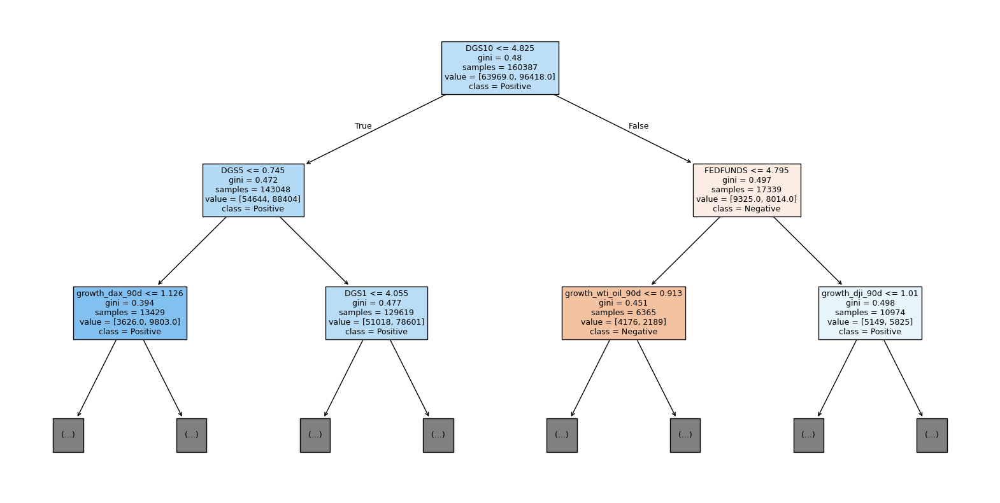

In [102]:
# visualisation: decision tree for a few levels (max_depth variable)
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

# Assuming clf is your trained DecisionTreeClassifier
plt.figure(figsize=(20,10))  # Set the size of the figure
plot_tree(clf_10,
          filled=True,
          feature_names=train_columns,
          class_names=['Negative', 'Positive'],
          max_depth=2)
plt.show()

In [103]:
# Feautures importance function to predict future returns (based on the classifier)
# get feature importance from 'clf' (classifier) and 'train_columns' (column names)

def get_importances(clf, train_columns):
  # Assuming clf is your trained DecisionTreeClassifier
  feature_importance = clf.feature_importances_

  # Assuming X_train is your training features
  feature_names = train_columns

  # Create a DataFrame to store feature importance
  feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importance})

  # Sort the DataFrame by importance in descending order
  feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

  # Print or display the feature importance DataFrame
  # print(feature_importance_df)
  return feature_importance_df

In [104]:
get_importances(clf_10, train_columns).head(10)

,Feature,Importance
183,DGS10,0.069728
181,DGS1,0.051858
178,cpi_core_yoy,0.047625
35,growth_gold_365d,0.039889
16,growth_snp500_90d,0.032239
93,ad,0.032157
41,growth_wti_oil_365d,0.030907
95,obv,0.028950
47,growth_brent_oil_365d,0.027427
5,growth_365d,0.026455


In [105]:
get_importances(clf_20, train_columns).head(10)

,Feature,Importance
93,ad,0.042953
95,obv,0.038659
5,growth_365d,0.037321
90,trix,0.032590
183,DGS10,0.031870
174,volatility,0.026094
178,cpi_core_yoy,0.022718
181,DGS1,0.020726
55,adxr,0.020287
4,growth_90d,0.019596


### 1.4.5 Merge with the original df for predictions (only when predicted on test dataset)

In [106]:
# current predictions from MANUAL
PREDICTIONS

['pred0_manual_cci', 'pred1_manual_prev_g1', 'pred2_manual_prev_g1_and_snp']

In [107]:
new_df.head()

,Open,High,Low,Close_x,Volume,Dividends,Stock Splits,Ticker,Year,Month,...,ticker_type_EU,ticker_type_INDIA,ticker_type_US,split,pred0_manual_cci,pred1_manual_prev_g1,pred2_manual_prev_g1_and_snp,is_correct_pred0,is_correct_pred1,is_correct_pred2
3490,35.975752,36.358881,34.328300,35.726719,53228400.0,0.0,0.0,MSFT,2000,January,...,0,0,1,train,0,1,1,1,0,0
3491,34.807221,35.899137,34.404936,34.519875,54119000.0,0.0,0.0,MSFT,2000,January,...,0,0,1,train,0,1,0,1,0,1
3492,34.060124,35.669264,33.523744,34.883850,64059600.0,0.0,0.0,MSFT,2000,January,...,0,0,1,train,0,1,0,1,0,1
3493,34.385780,34.903004,33.217238,33.715305,54976600.0,0.0,0.0,MSFT,2000,January,...,0,0,1,train,0,1,0,1,0,1
3494,33.293845,34.404917,32.891561,34.155884,62013600.0,0.0,0.0,MSFT,2000,January,...,0,0,1,train,0,1,1,1,0,0


In [108]:
# index in df is not unique
np.sort(new_df.groupby(new_df.index).split.count())

array([ 1,  1,  1, ..., 27, 27, 27])

In [109]:
# it's hard to join with pred10_df - as index is totally different
pred10_df.head()

,pred_tree_clf10
8933,0
8934,0
8935,1
8936,1
8937,1


In [ ]:
# TODO 4: JOIN predictions with the original dataframe (define a new column):
#  so, that there are columns pred_tree_clf10 AND pred_tree_clf20